# Prediccion de vivienda

## Importacion de librerias
Se importraran las librerias que se usaran en este proyecto

In [1]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import seaborn as sns

## Importar datos

In [2]:
# Importar archivo desde drive
url='https://drive.google.com/file/d/1Hd2Her78ffJTHq_kFT5fE6Kapn53Bodp/view?usp=sharing'
file_id=url.split('/')[-2]
dwn_url='https://drive.google.com/uc?id=' + file_id
datadrive = pd.read_csv(dwn_url, sep =",")

## Exploracion de datos 

In [3]:
# se extraen las primeras 5 filas para ver los datos
datadrive.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated,street,city,statezip,country
0,2014-05-02 00:00:00,313000.0,3.0,1.50,1340,7912,1.5,0,0,3,1340,0,1955,2005,18810 Densmore Ave N,Shoreline,WA 98133,USA
1,2014-05-02 00:00:00,2384000.0,5.0,2.50,3650,9050,2.0,0,4,5,3370,280,1921,0,709 W Blaine St,Seattle,WA 98119,USA
2,2014-05-02 00:00:00,342000.0,3.0,2.00,1930,11947,1.0,0,0,4,1930,0,1966,0,26206-26214 143rd Ave SE,Kent,WA 98042,USA
3,2014-05-02 00:00:00,420000.0,3.0,2.25,2000,8030,1.0,0,0,4,1000,1000,1963,0,857 170th Pl NE,Bellevue,WA 98008,USA
4,2014-05-02 00:00:00,550000.0,4.0,2.50,1940,10500,1.0,0,0,4,1140,800,1976,1992,9105 170th Ave NE,Redmond,WA 98052,USA


In [4]:
# Nombre de las columnas
datadrive.columns

Index(['date', 'price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot',
       'floors', 'waterfront', 'view', 'condition', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'street', 'city',
       'statezip', 'country'],
      dtype='object')

In [5]:
# Numero de filas y columnas
datadrive.shape

(4600, 18)

In [6]:
# Tipo de datos de cada columna
datadrive.dtypes

date              object
price            float64
bedrooms         float64
bathrooms        float64
sqft_living        int64
sqft_lot           int64
floors           float64
waterfront         int64
view               int64
condition          int64
sqft_above         int64
sqft_basement      int64
yr_built           int64
yr_renovated       int64
street            object
city              object
statezip          object
country           object
dtype: object

## limpieza y duplicados

In [7]:
# Se ve la informacion de las columnas, con el proposito de saber que contiene cada una asi como si tiene valores unicos o repetidos (categorias)
for col in datadrive.columns:
    print("-"*20 + col+"-"*20)
    display(datadrive[col].value_counts())

--------------------date--------------------


date
2014-06-23 00:00:00    142
2014-06-25 00:00:00    131
2014-06-26 00:00:00    131
2014-07-08 00:00:00    127
2014-07-09 00:00:00    121
                      ... 
2014-06-07 00:00:00      4
2014-07-06 00:00:00      3
2014-05-11 00:00:00      2
2014-07-04 00:00:00      2
2014-05-17 00:00:00      1
Name: count, Length: 70, dtype: int64

--------------------price--------------------


price
0.000000         49
300000.000000    42
400000.000000    31
600000.000000    29
450000.000000    29
                 ..
691000.000000     1
282766.666667     1
406062.500000     1
473200.000000     1
454790.000000     1
Name: count, Length: 1741, dtype: int64

--------------------bedrooms--------------------


bedrooms
3.0    2032
4.0    1531
2.0     566
5.0     353
6.0      61
1.0      38
7.0      14
8.0       2
0.0       2
9.0       1
Name: count, dtype: int64

--------------------bathrooms--------------------


bathrooms
2.50    1189
1.00     743
1.75     629
2.00     427
2.25     419
1.50     291
2.75     276
3.00     167
3.50     162
3.25     136
3.75      37
4.50      29
4.00      23
4.25      23
0.75      17
4.75       7
5.00       6
5.25       4
5.50       4
1.25       3
0.00       2
6.25       2
5.75       1
8.00       1
6.50       1
6.75       1
Name: count, dtype: int64

--------------------sqft_living--------------------


sqft_living
1940    32
1720    32
1840    31
1660    31
2000    30
        ..
3710     1
490      1
2286     1
2961     1
5780     1
Name: count, Length: 566, dtype: int64

--------------------sqft_lot--------------------


sqft_lot
5000     80
6000     65
4000     54
7200     50
4800     29
         ..
10578     1
7864      1
1572      1
12261     1
35868     1
Name: count, Length: 3113, dtype: int64

--------------------floors--------------------


floors
1.0    2174
2.0    1811
1.5     444
3.0     128
2.5      41
3.5       2
Name: count, dtype: int64

--------------------waterfront--------------------


waterfront
0    4567
1      33
Name: count, dtype: int64

--------------------view--------------------


view
0    4140
2     205
3     116
4      70
1      69
Name: count, dtype: int64

--------------------condition--------------------


condition
3    2875
4    1252
5     435
2      32
1       6
Name: count, dtype: int64

--------------------sqft_above--------------------


sqft_above
1010    47
1200    47
1300    45
1140    44
1320    43
        ..
3910     1
3831     1
1954     1
8020     1
2538     1
Name: count, Length: 511, dtype: int64

--------------------sqft_basement--------------------


sqft_basement
0       2745
500       53
600       45
800       43
900       41
        ... 
1730       1
1870       1
1520       1
2030       1
1640       1
Name: count, Length: 207, dtype: int64

--------------------yr_built--------------------


yr_built
2006    111
2005    104
2007     93
2004     92
1978     90
       ... 
1915      6
1935      6
1933      5
1934      4
1936      3
Name: count, Length: 115, dtype: int64

--------------------yr_renovated--------------------


yr_renovated
0       2735
2000     170
2003     151
2009     109
2001     109
2005      95
2004      77
2014      72
2006      68
2013      61
1923      57
1994      57
1989      55
2011      54
2012      45
2008      45
1988      43
2002      41
1983      41
1999      41
1998      40
1993      39
1912      33
1992      32
1979      32
2010      30
1985      29
1997      28
1996      22
1982      22
1972      17
1990      16
1956      15
1963      12
1969      11
1984      10
1968       9
1970       9
1954       8
1945       7
2007       7
1974       6
1934       6
1958       5
1986       5
1971       5
1978       3
1955       2
1980       2
1995       2
1981       1
1953       1
1987       1
1966       1
1960       1
1948       1
1991       1
1913       1
1977       1
1975       1
Name: count, dtype: int64

--------------------street--------------------


street
2520 Mulberry Walk NE    4
2500 Mulberry Walk NE    3
11716 16th Ave NE        2
35229 SE Terrace St      2
13800 453rd Ave SE       2
                        ..
501 N 143rd St           1
14855 SE 10th Pl         1
759 Ilwaco Pl NE         1
5148 S Creston St        1
8519 28th Ave NW         1
Name: count, Length: 4525, dtype: int64

--------------------city--------------------


city
Seattle                1573
Renton                  293
Bellevue                286
Redmond                 235
Kirkland                187
Issaquah                187
Kent                    185
Auburn                  176
Sammamish               175
Federal Way             148
Shoreline               123
Woodinville             115
Maple Valley             96
Mercer Island            86
Burien                   74
Snoqualmie               71
Kenmore                  66
Des Moines               58
North Bend               50
Covington                43
Duvall                   42
Lake Forest Park         36
Bothell                  33
Newcastle                33
Tukwila                  29
SeaTac                   29
Vashon                   29
Enumclaw                 28
Carnation                22
Normandy Park            18
Clyde Hill               11
Fall City                11
Medina                   11
Black Diamond             9
Ravensdale                7
Pacific        

--------------------statezip--------------------


statezip
WA 98103    148
WA 98052    135
WA 98117    132
WA 98115    130
WA 98006    110
           ... 
WA 98047      6
WA 98288      3
WA 98050      2
WA 98354      2
WA 98068      1
Name: count, Length: 77, dtype: int64

--------------------country--------------------


country
USA    4600
Name: count, dtype: int64

In [8]:
# Se buscan nulos
datadrive.isnull().sum()

date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
street           0
city             0
statezip         0
country          0
dtype: int64

In [9]:
# Se buscan duplicados
datadrive[datadrive.duplicated()]

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated,street,city,statezip,country


In [10]:
"""La funcion nunique nos permite saber cuantos valores diferentes hay en cada columna, es similar a lo que se hizo al inicio,
   con la diferencias de que aqi solo extraemos el numero de valores unicos y no cuales son"""
datadrive.nunique()

date               70
price            1741
bedrooms           10
bathrooms          26
sqft_living       566
sqft_lot         3113
floors              6
waterfront          2
view                5
condition           5
sqft_above        511
sqft_basement     207
yr_built          115
yr_renovated       60
street           4525
city               44
statezip           77
country             1
dtype: int64

In [11]:
datadrive.drop(columns=["country"],inplace=True)

In [12]:
datadrive.nunique()

date               70
price            1741
bedrooms           10
bathrooms          26
sqft_living       566
sqft_lot         3113
floors              6
waterfront          2
view                5
condition           5
sqft_above        511
sqft_basement     207
yr_built          115
yr_renovated       60
street           4525
city               44
statezip           77
dtype: int64

## Visualizacion y correccion de outliers
por medio de graficos se hara la correccion de outliers asi como su tratamiento

Variables numericas = price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,sqft_above,sqft_basement,

Variales categoricas = street,city,statezip,country,view,condition,waterfront

date = yr_built,yr_renovated  

In [13]:
# Se separan las variables numericas para generar boxplots, con el fin de observar los valores atipicos
Variables_numericas = ["price","bedrooms","bathrooms","sqft_living","sqft_lot","floors","sqft_above","sqft_basement","yr_built","yr_renovated"]

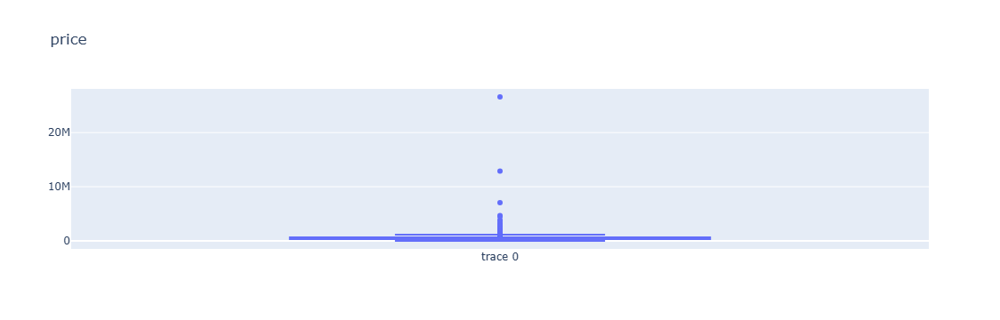

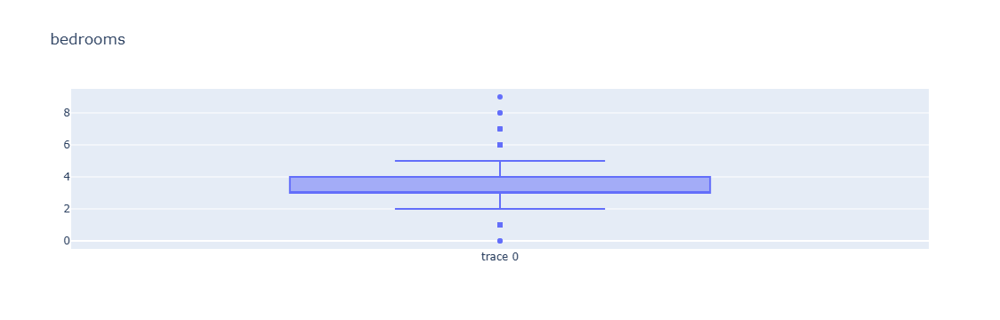

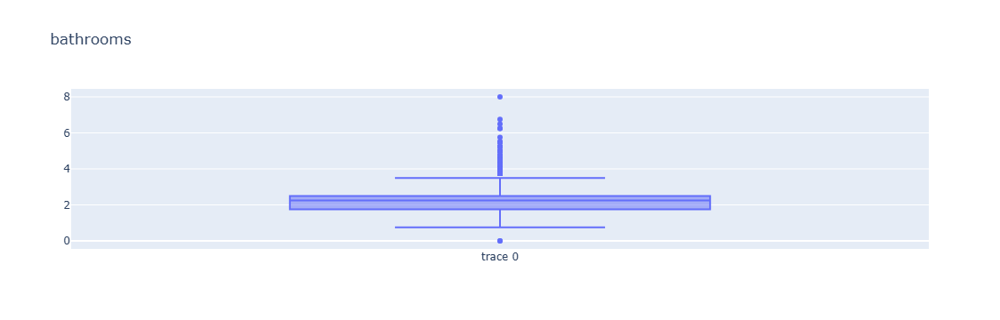

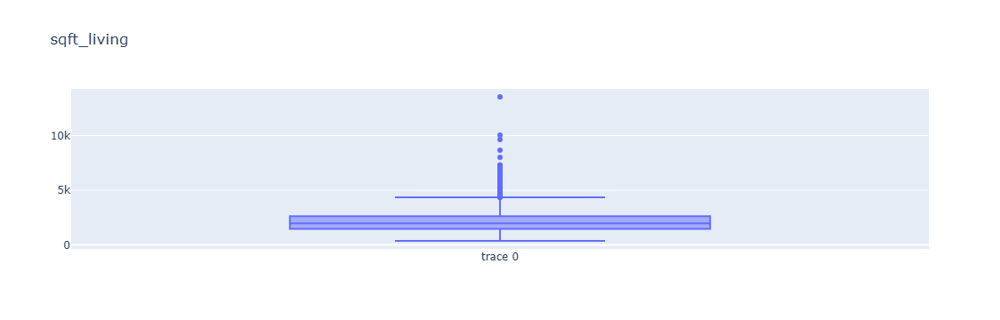

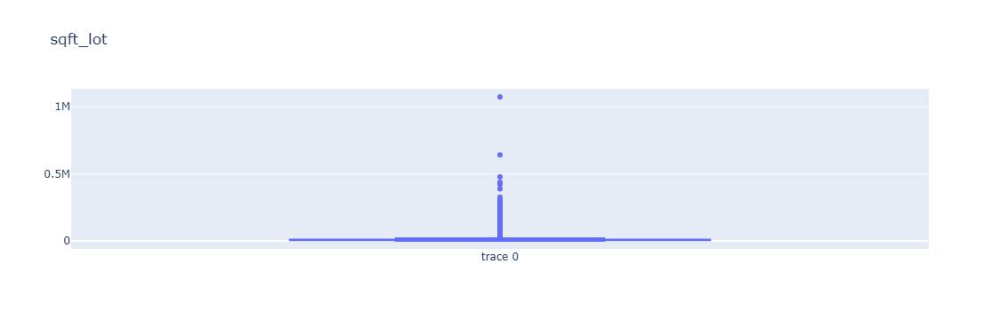

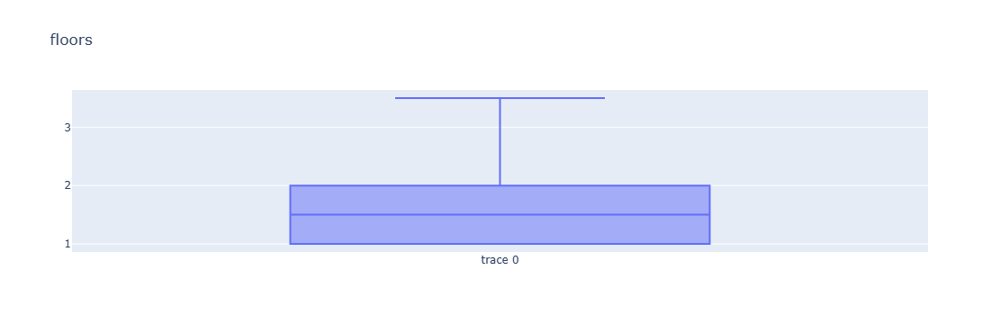

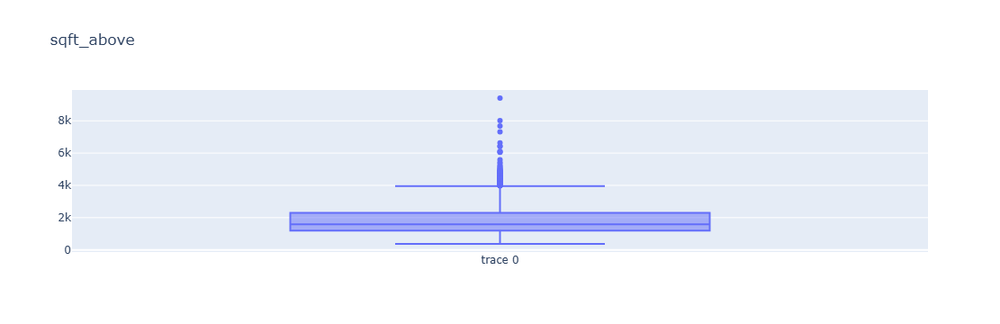

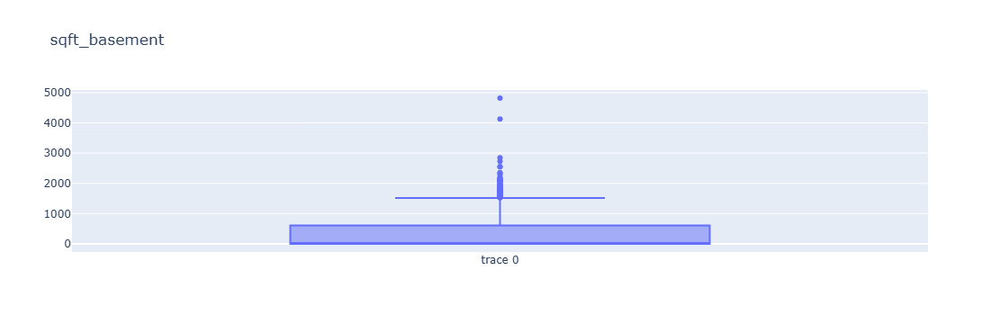

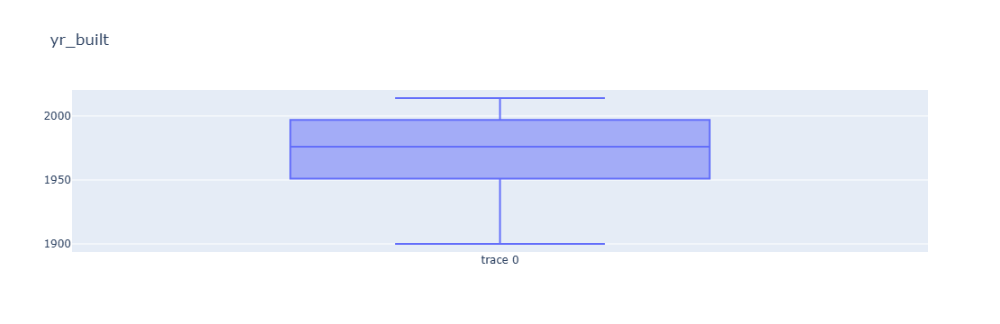

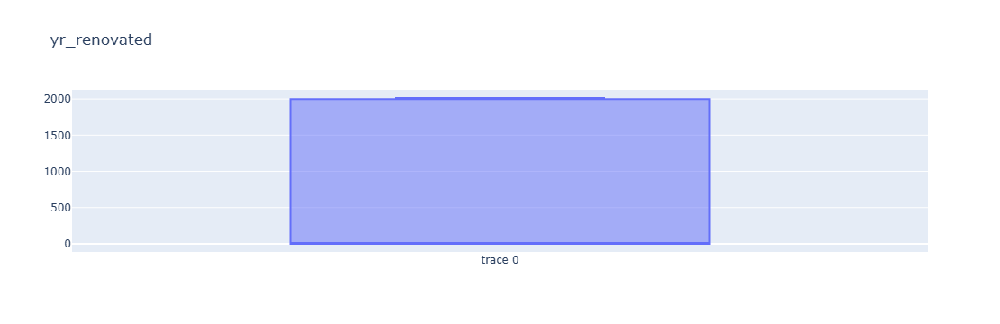

In [14]:
for i in Variables_numericas:
  data = go.Box(y = datadrive[i])
  layout = go.Layout(title = i)
  fig = go.Figure(data = data, layout = layout)
  fig.show()

In [15]:
# se crea una copia del dataframe para manipular este sin perder el otro
datasn=datadrive.copy()

In [16]:
datasn

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated,street,city,statezip
0,2014-05-02 00:00:00,3.130000e+05,3.0,1.50,1340,7912,1.5,0,0,3,1340,0,1955,2005,18810 Densmore Ave N,Shoreline,WA 98133
1,2014-05-02 00:00:00,2.384000e+06,5.0,2.50,3650,9050,2.0,0,4,5,3370,280,1921,0,709 W Blaine St,Seattle,WA 98119
2,2014-05-02 00:00:00,3.420000e+05,3.0,2.00,1930,11947,1.0,0,0,4,1930,0,1966,0,26206-26214 143rd Ave SE,Kent,WA 98042
3,2014-05-02 00:00:00,4.200000e+05,3.0,2.25,2000,8030,1.0,0,0,4,1000,1000,1963,0,857 170th Pl NE,Bellevue,WA 98008
4,2014-05-02 00:00:00,5.500000e+05,4.0,2.50,1940,10500,1.0,0,0,4,1140,800,1976,1992,9105 170th Ave NE,Redmond,WA 98052
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4595,2014-07-09 00:00:00,3.081667e+05,3.0,1.75,1510,6360,1.0,0,0,4,1510,0,1954,1979,501 N 143rd St,Seattle,WA 98133
4596,2014-07-09 00:00:00,5.343333e+05,3.0,2.50,1460,7573,2.0,0,0,3,1460,0,1983,2009,14855 SE 10th Pl,Bellevue,WA 98007
4597,2014-07-09 00:00:00,4.169042e+05,3.0,2.50,3010,7014,2.0,0,0,3,3010,0,2009,0,759 Ilwaco Pl NE,Renton,WA 98059
4598,2014-07-10 00:00:00,2.034000e+05,4.0,2.00,2090,6630,1.0,0,0,3,1070,1020,1974,0,5148 S Creston St,Seattle,WA 98178


Por medio del rango inter cuartil se trataran todos los outliers numericos, es decir el IQR, siendo IQR = Q3 - Q1, Q1 – 1.5*IQR el limite inferior mientras que el límite superior viene dado por Q3 + 1.5*IQR

## Outliers price

In [17]:
Q1 = datasn["price"].quantile(0.25)
Q3 = datasn["price"].quantile(0.75)
IQR = Q3 - Q1
I = (Q1 - 1.5 * IQR)
S = (Q1 + 1.5 * IQR)
indice = (datasn["price"] >= I) & (datasn["price"] <= S)
datacl=datasn[indice]

In [18]:
datacl

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated,street,city,statezip
0,2014-05-02 00:00:00,313000.000000,3.0,1.50,1340,7912,1.5,0,0,3,1340,0,1955,2005,18810 Densmore Ave N,Shoreline,WA 98133
2,2014-05-02 00:00:00,342000.000000,3.0,2.00,1930,11947,1.0,0,0,4,1930,0,1966,0,26206-26214 143rd Ave SE,Kent,WA 98042
3,2014-05-02 00:00:00,420000.000000,3.0,2.25,2000,8030,1.0,0,0,4,1000,1000,1963,0,857 170th Pl NE,Bellevue,WA 98008
4,2014-05-02 00:00:00,550000.000000,4.0,2.50,1940,10500,1.0,0,0,4,1140,800,1976,1992,9105 170th Ave NE,Redmond,WA 98052
5,2014-05-02 00:00:00,490000.000000,2.0,1.00,880,6380,1.0,0,0,3,880,0,1938,1994,522 NE 88th St,Seattle,WA 98115
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4595,2014-07-09 00:00:00,308166.666667,3.0,1.75,1510,6360,1.0,0,0,4,1510,0,1954,1979,501 N 143rd St,Seattle,WA 98133
4596,2014-07-09 00:00:00,534333.333333,3.0,2.50,1460,7573,2.0,0,0,3,1460,0,1983,2009,14855 SE 10th Pl,Bellevue,WA 98007
4597,2014-07-09 00:00:00,416904.166667,3.0,2.50,3010,7014,2.0,0,0,3,3010,0,2009,0,759 Ilwaco Pl NE,Renton,WA 98059
4598,2014-07-10 00:00:00,203400.000000,4.0,2.00,2090,6630,1.0,0,0,3,1070,1020,1974,0,5148 S Creston St,Seattle,WA 98178


In [19]:
data = go.Box(y = datacl["price"])
layout = go.Layout(title = "price")
fig = go.Figure(data = data, layout = layout)
fig.show()

## Outliers sqft_living

In [20]:
Q1 = datacl["sqft_living"].quantile(0.25)
Q3 = datacl["sqft_living"].quantile(0.75)
IQR = Q3 - Q1
I = (Q1 - 1.5 * IQR)
S = (Q1 + 1.5 * IQR)
indice = (datacl["sqft_living"] >= I) & (datacl["bedrooms"] <= S)
datacl=datacl[indice]

In [21]:
data = go.Box(y = datacl["sqft_living"])
layout = go.Layout(title = "sqft_living")
fig = go.Figure(data = data, layout = layout)
fig.show()

## Outliers sqft_lot

In [22]:
Q1 = datacl["sqft_lot"].quantile(0.25)
Q3 = datacl["sqft_lot"].quantile(0.75)
IQR = Q3 - Q1
I = (Q1 - 1.5 * IQR)
S = (Q1 + 1.5 * IQR)
indice = (datacl["sqft_lot"] >= I) & (datacl["sqft_lot"] <= S)
datacl=datacl[indice]

In [23]:
data = go.Box(y = datacl["sqft_lot"])
layout = go.Layout(title = "sqft_lot")
fig = go.Figure(data = data, layout = layout)
fig.show()

## Outliers sqft_above

In [24]:
Q1 = datacl["sqft_above"].quantile(0.25)
Q3 = datacl["sqft_above"].quantile(0.75)
IQR = Q3 - Q1
I = (Q1 - 1.5 * IQR)
S = (Q1 + 1.5 * IQR)
indice = (datacl["sqft_above"] >= I) & (datacl["sqft_above"] <= S)
datacl=datacl[indice]

In [25]:
data = go.Box(y = datacl["sqft_above"])
layout = go.Layout(title = "sqft_above")
fig = go.Figure(data = data, layout = layout)
fig.show()

## Outliers sqft_basement

In [26]:
Q1 = datacl["sqft_basement"].quantile(0.25)
Q3 = datacl["sqft_basement"].quantile(0.75)
IQR = Q3 - Q1
I = (Q1 - 1.5 * IQR)
S = (Q1 + 1.5 * IQR)
indice = (datacl["sqft_basement"] >= I) & (datacl["sqft_basement"] <= S)
datacl=datacl[indice]

In [27]:
data = go.Box(y = datacl["sqft_basement"])
layout = go.Layout(title = "sqft_bastement")
fig = go.Figure(data = data, layout = layout)
fig.show()

## Outliers manuales
Se hara una comprobacion una vez terminada la limpieza por rangos inter cuartilicos para observar que nho falte quitar ningun outlier

In [28]:
for i in Variables_numericas:
  data = go.Box(y = datacl[i])
  layout = go.Layout(title = i)
  fig = go.Figure(data = data, layout = layout)
  fig.show()

Debido a que sqft_living tiene todavia outliers, estos se eliminaran de forma "manual"

In [29]:
datacl[datacl["sqft_living"]>=2950]

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated,street,city,statezip
789,2014-05-16 00:00:00,799000.0,4.0,3.25,3120,5000,2.0,0,0,3,2370,750,2005,0,2561 NE 85th St,Seattle,WA 98115
1044,2014-05-20 00:00:00,785000.0,4.0,3.50,3070,4684,2.0,0,0,3,2190,880,2009,0,2500-2556 NW Alpine Crest Way,Issaquah,WA 98027
3072,2014-06-23 00:00:00,495000.0,3.0,2.00,2950,12196,2.0,0,0,4,2310,640,1918,1974,2433 SW 149th St,Burien,WA 98166
3173,2014-06-24 00:00:00,405000.0,3.0,2.50,3170,12750,2.0,0,0,3,2360,810,1995,0,29414 2nd Ave SW,Federal Way,WA 98023
3205,2014-06-24 00:00:00,751000.0,4.0,3.25,3090,9571,2.0,0,0,3,2370,720,2004,2003,11719 157th Ave NE,Redmond,WA 98052
3517,2014-06-26 00:00:00,782900.0,4.0,3.25,3060,3898,2.0,0,0,3,2300,760,2014,0,2354 NW Harmony Way,Issaquah,WA 98027


In [30]:
datacl.drop(datacl[datacl["sqft_living"]>=2950].index, inplace = True)

In [31]:
datacl[datacl["sqft_living"]>=2950]

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated,street,city,statezip


Se vuelven a checar todas las columnas con el fin de ver la informacion que estas contienen una vez limpios nuestros datos

In [32]:
for col in datadrive.columns:
    print("-"*20 + col+"-"*20)
    display(datacl[col].value_counts())

--------------------date--------------------


date
2014-06-23 00:00:00    87
2014-06-25 00:00:00    79
2014-06-24 00:00:00    71
2014-05-20 00:00:00    70
2014-07-09 00:00:00    66
                       ..
2014-05-31 00:00:00     2
2014-06-07 00:00:00     1
2014-05-17 00:00:00     1
2014-05-11 00:00:00     1
2014-07-06 00:00:00     1
Name: count, Length: 70, dtype: int64

--------------------price--------------------


price
300000.000000    33
440000.000000    21
400000.000000    21
250000.000000    21
415000.000000    21
                 ..
406062.500000     1
282766.666667     1
486445.833333     1
486895.000000     1
337945.750000     1
Name: count, Length: 1054, dtype: int64

--------------------bedrooms--------------------


bedrooms
3.0    1395
4.0     537
2.0     481
5.0      69
1.0      29
6.0      10
7.0       2
Name: count, dtype: int64

--------------------bathrooms--------------------


bathrooms
1.00    646
2.50    525
1.75    416
2.00    285
2.25    240
1.50    227
2.75     60
3.00     46
3.25     32
3.50     27
0.75      9
3.75      4
1.25      3
4.00      2
4.25      1
Name: count, dtype: int64

--------------------sqft_living--------------------


sqft_living
1720    30
1410    28
1660    27
1490    26
1840    26
        ..
2025     1
2720     1
2880     1
2068     1
1954     1
Name: count, Length: 274, dtype: int64

--------------------sqft_lot--------------------


sqft_lot
5000     50
6000     41
7200     35
4000     30
9600     22
         ..
12874     1
1666      1
9655      1
1180      1
10460     1
Name: count, Length: 1645, dtype: int64

--------------------floors--------------------


floors
1.0    1393
2.0     731
1.5     278
3.0     110
2.5      10
3.5       1
Name: count, dtype: int64

--------------------waterfront--------------------


waterfront
0    2523
Name: count, dtype: int64

--------------------view--------------------


view
0    2415
2      65
3      19
1      18
4       6
Name: count, dtype: int64

--------------------condition--------------------


condition
3    1551
4     722
5     230
2      18
1       2
Name: count, dtype: int64

--------------------sqft_above--------------------


sqft_above
1010    41
1150    38
1200    37
1140    36
1090    32
        ..
1536     1
1595     1
2192     1
2068     1
1954     1
Name: count, Length: 233, dtype: int64

--------------------sqft_basement--------------------


sqft_basement
0      1619
500      43
600      38
700      28
800      28
       ... 
265       1
862       1
176       1
20        1
65        1
Name: count, Length: 93, dtype: int64

--------------------yr_built--------------------


yr_built
2007    59
2005    58
1967    55
2008    52
2006    50
        ..
1933     3
1913     2
1935     2
1936     1
1934     1
Name: count, Length: 115, dtype: int64

--------------------yr_renovated--------------------


yr_renovated
0       1446
2000      84
2003      80
2005      62
2001      61
2009      54
2004      43
1994      42
2011      38
1989      34
2014      34
2012      33
2006      31
1988      29
1999      29
2013      29
2002      28
2008      28
1998      27
1983      26
1993      25
2010      22
1979      20
1997      18
1985      18
1923      18
1996      16
1992      16
1912      16
1982      16
1972       9
1990       9
1969       9
1963       8
1956       8
1968       7
1954       7
1984       7
1958       5
1970       5
1971       5
1974       4
1934       3
1945       3
1986       2
2007       2
1981       1
1966       1
1953       1
1955       1
1980       1
1948       1
1978       1
Name: count, dtype: int64

--------------------street--------------------


street
2520 Mulberry Walk NE    4
2500 Mulberry Walk NE    3
14634 128th Ave NE       2
106 24th Ave E           2
8354 11th Ave NW         2
                        ..
15804 198th Pl NE        1
4314 NE 6th Pl           1
2640 NW 56th St          1
6222 30th Ave NE         1
2533 155th Pl SE         1
Name: count, Length: 2478, dtype: int64

--------------------city--------------------


city
Seattle                1122
Renton                  159
Kent                    114
Kirkland                101
Federal Way              98
Shoreline                95
Auburn                   94
Redmond                  93
Bellevue                 89
Issaquah                 89
Maple Valley             57
Burien                   46
Des Moines               43
Sammamish                35
Kenmore                  34
Covington                29
Woodinville              28
North Bend               21
Snoqualmie               19
SeaTac                   19
Bothell                  18
Lake Forest Park         17
Duvall                   16
Tukwila                  16
Enumclaw                 14
Mercer Island            11
Newcastle                10
Normandy Park             7
Black Diamond             6
Pacific                   5
Carnation                 4
Algona                    3
Milton                    2
Vashon                    2
Inglewood-Finn Hill       1
Skykomish      

--------------------statezip--------------------


statezip
WA 98103    117
WA 98115    100
WA 98117     97
WA 98133     79
WA 98052     70
           ... 
WA 98288      1
WA 98051      1
WA 98068      1
WA 98050      1
WA 98024      1
Name: count, Length: 76, dtype: int64

In [33]:
# Se elimina waterfront por ser unico en la columna y no aportar informacion
datacl.drop(columns=["waterfront"],inplace=True)

In [34]:
datacl

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated,street,city,statezip
0,2014-05-02 00:00:00,313000.000000,3.0,1.50,1340,7912,1.5,0,3,1340,0,1955,2005,18810 Densmore Ave N,Shoreline,WA 98133
2,2014-05-02 00:00:00,342000.000000,3.0,2.00,1930,11947,1.0,0,4,1930,0,1966,0,26206-26214 143rd Ave SE,Kent,WA 98042
4,2014-05-02 00:00:00,550000.000000,4.0,2.50,1940,10500,1.0,0,4,1140,800,1976,1992,9105 170th Ave NE,Redmond,WA 98052
5,2014-05-02 00:00:00,490000.000000,2.0,1.00,880,6380,1.0,0,3,880,0,1938,1994,522 NE 88th St,Seattle,WA 98115
6,2014-05-02 00:00:00,335000.000000,2.0,2.00,1350,2560,1.0,0,3,1350,0,1976,0,2616 174th Ave NE,Redmond,WA 98052
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4589,2014-07-08 00:00:00,182805.000000,3.0,1.00,1040,8892,1.0,0,4,800,240,1958,1972,1028 SW 307th St,Federal Way,WA 98023
4594,2014-07-09 00:00:00,210614.285714,3.0,2.50,1610,7223,2.0,0,3,1610,0,1994,0,26306 127th Ave SE,Kent,WA 98030
4595,2014-07-09 00:00:00,308166.666667,3.0,1.75,1510,6360,1.0,0,4,1510,0,1954,1979,501 N 143rd St,Seattle,WA 98133
4596,2014-07-09 00:00:00,534333.333333,3.0,2.50,1460,7573,2.0,0,3,1460,0,1983,2009,14855 SE 10th Pl,Bellevue,WA 98007


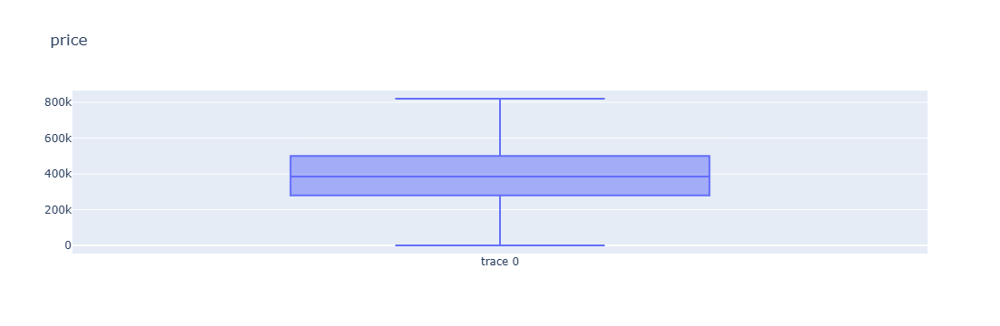

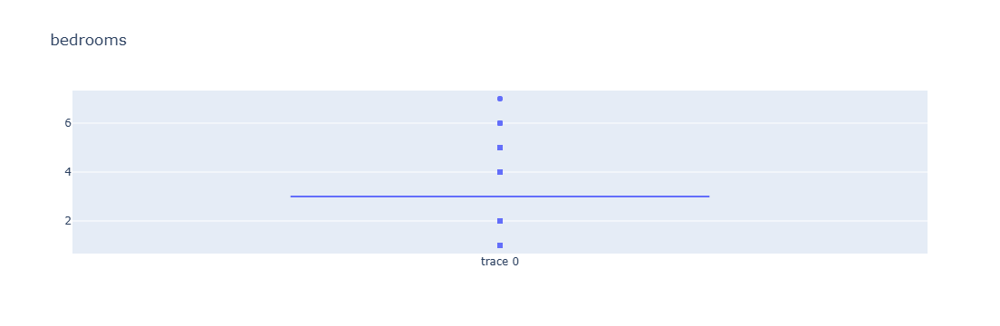

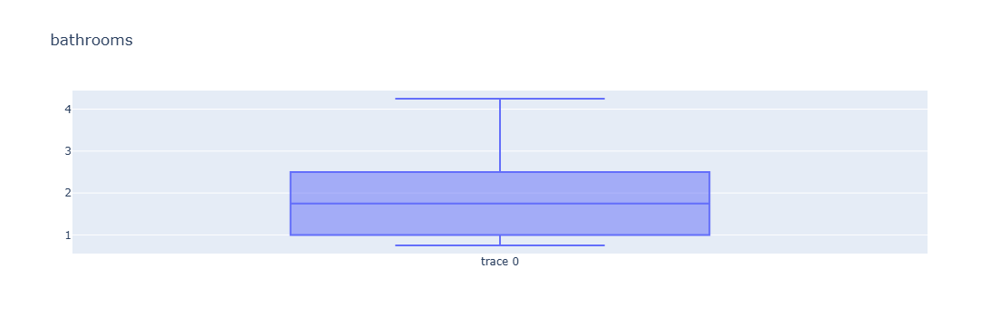

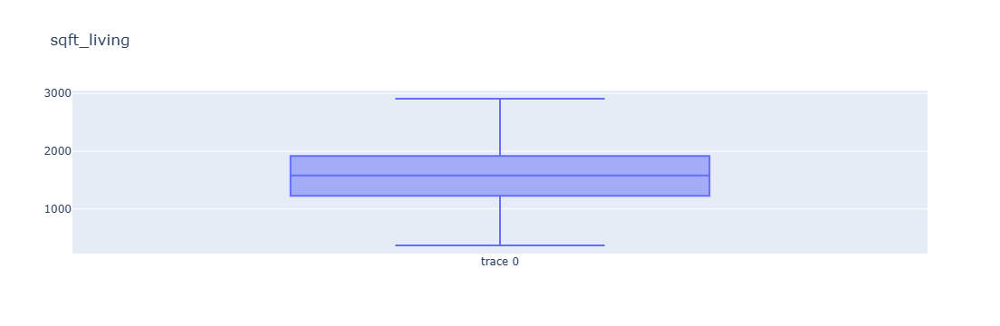

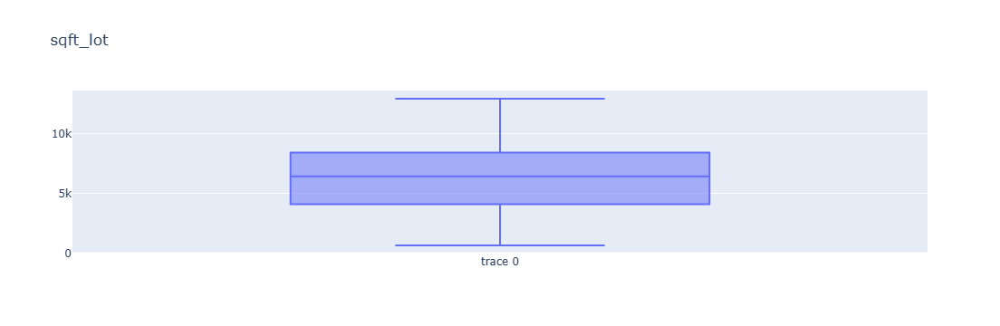

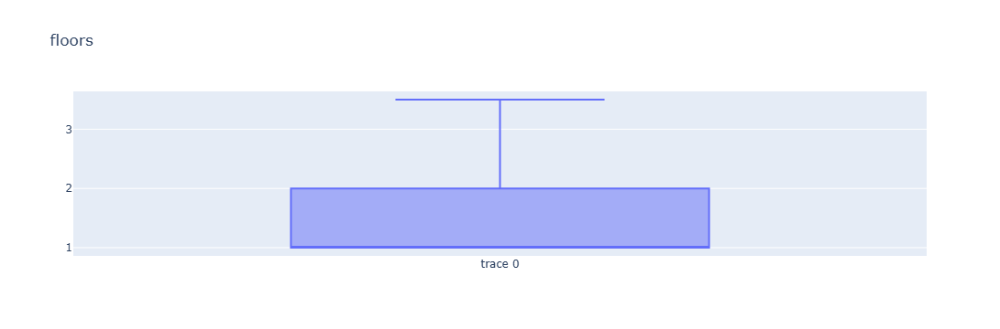

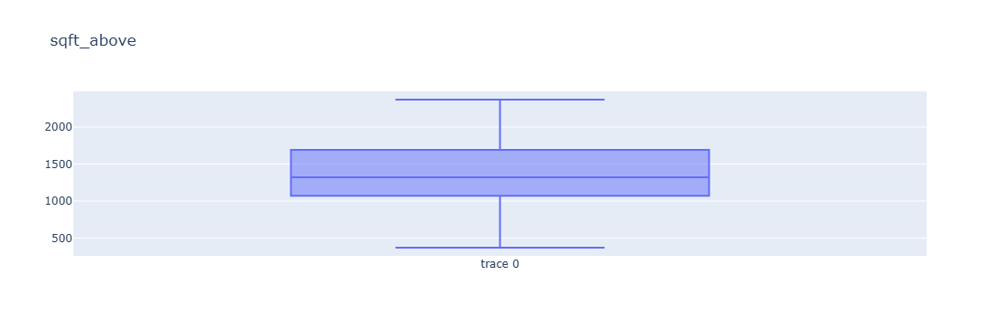

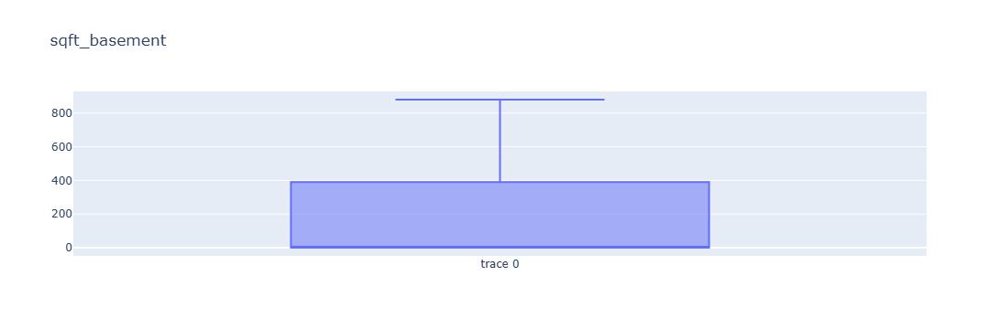

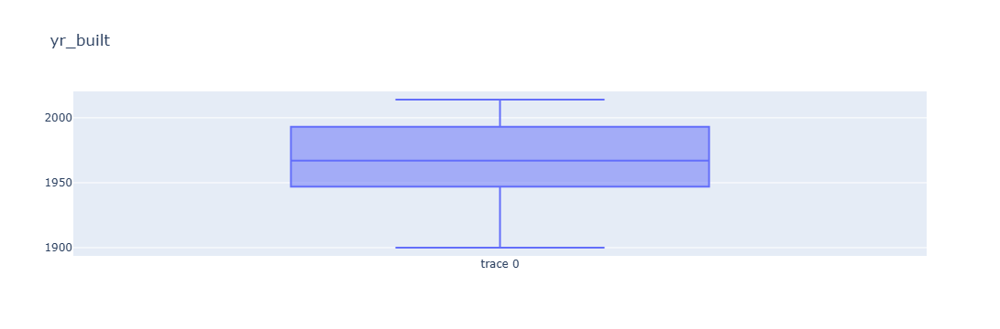

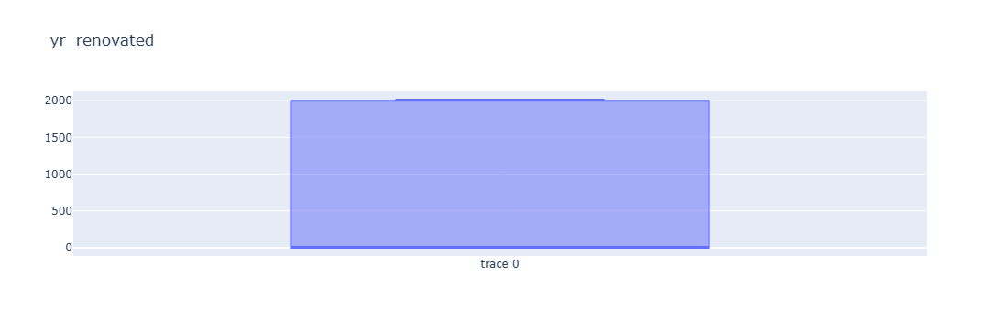

In [35]:
for i in Variables_numericas:
  data = go.Box(y = datacl[i])
  layout = go.Layout(title = i)
  fig = go.Figure(data = data, layout = layout)
  fig.show()

Se hace un plot para ver la relacion de todas las variables e identificar las posibles variables predictoras

<Figure size 2000x2000 with 0 Axes>

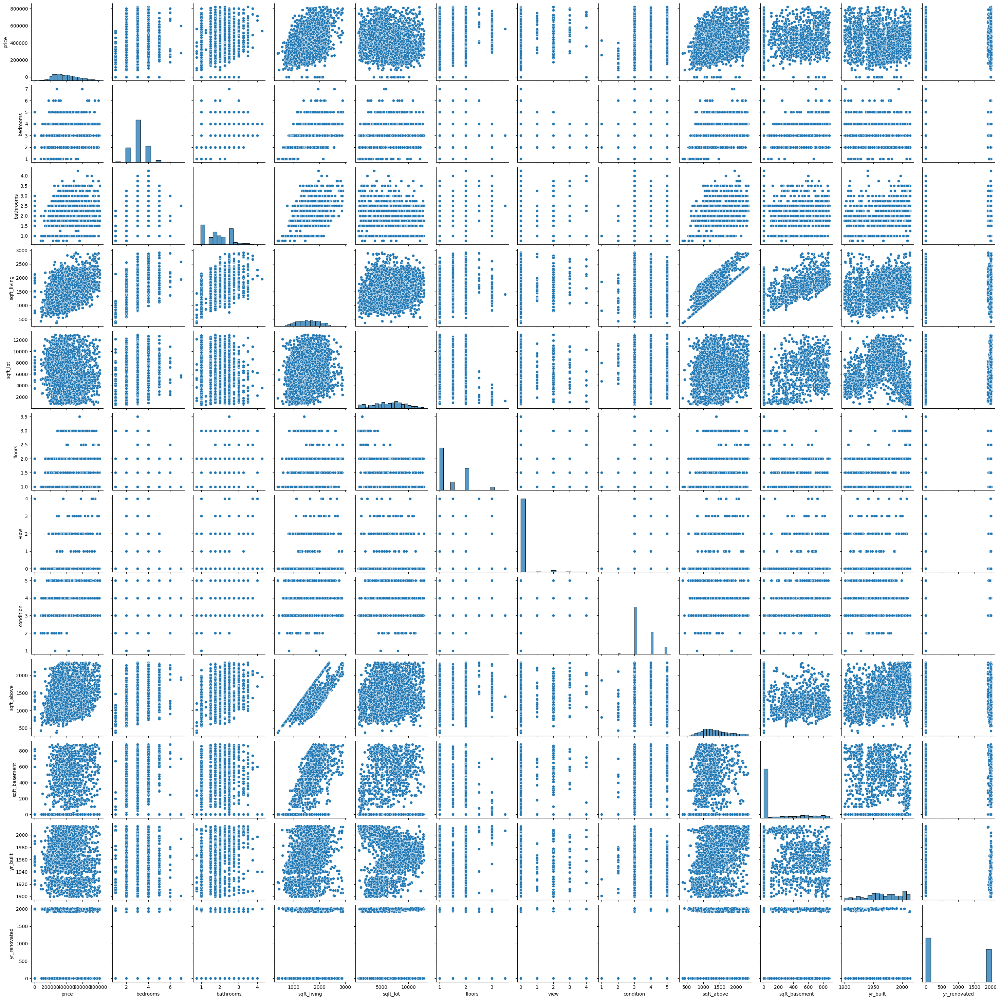

In [36]:
plt.figure(figsize=(20,20))
sns.pairplot(datacl)

El mapa de calor nos facilita ver la correlacion que las variables tienen

<Axes: >

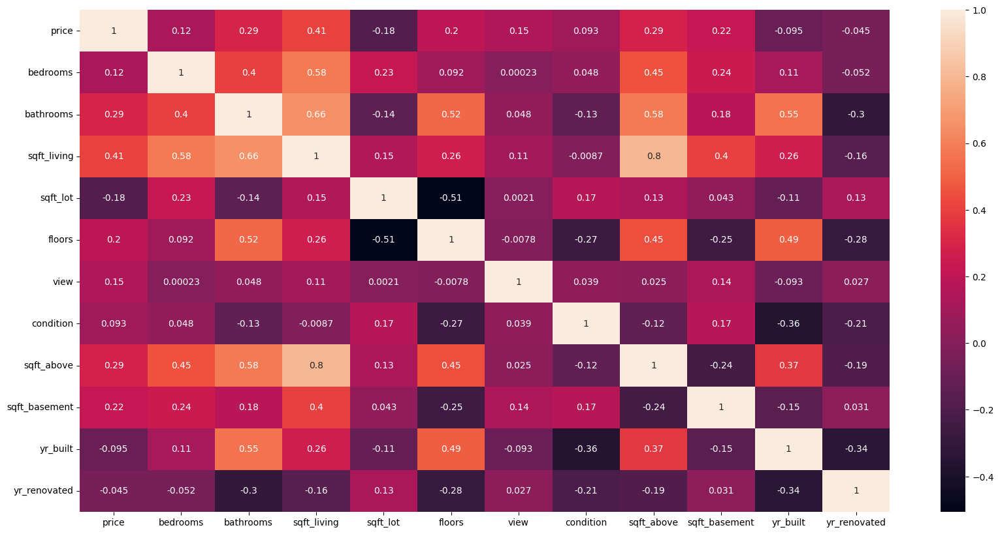

In [37]:
correlacion = datacl.select_dtypes(include=['number']).corr()
plt.figure(figsize=(20,10))
sns.heatmap(correlacion, annot=True)

<Axes: >

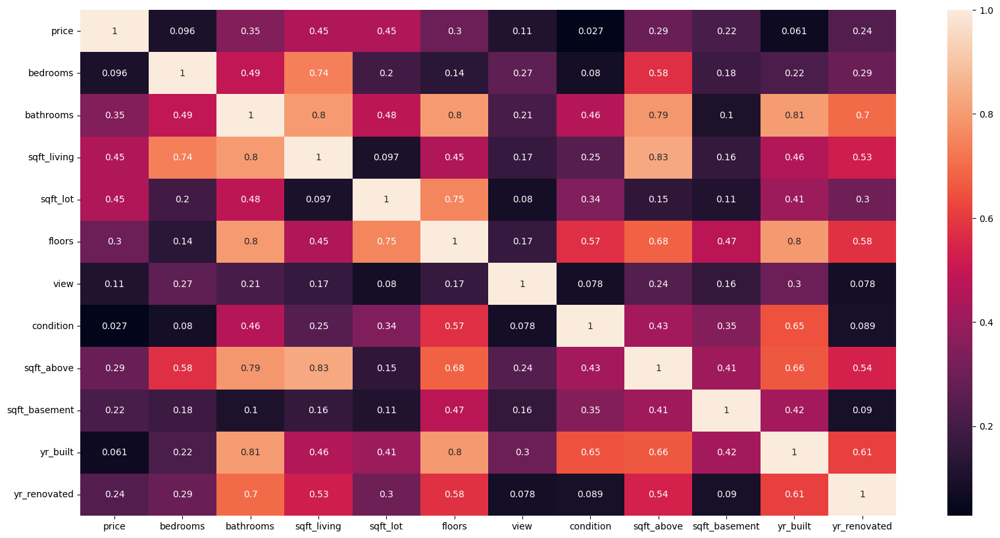

In [38]:
# Mapa con valor absoluto
plt.figure(figsize=(20,10))
sns.heatmap(correlacion.corr().abs(),annot = True)

In [39]:
# Se ordenan las variables de acuerdo a su correlacion con price
precio = correlacion.corr().abs()
precio = correlacion.loc[:,["price"]]
precio.sort_values(ascending=False, by= "price")

,price
price,1.000000
sqft_living,0.406244
bathrooms,0.294666
sqft_above,0.286174
sqft_basement,0.218152
floors,0.198593
view,0.146390
bedrooms,0.122213
condition,0.093372
yr_renovated,-0.045047


<Axes: >

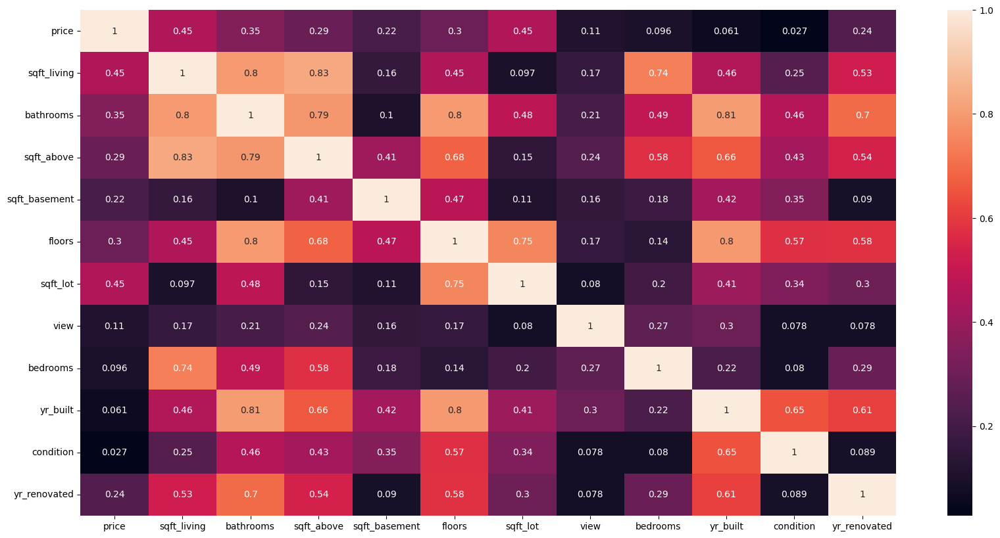

In [40]:
# Se vuelve a crear un mapa de calor pero con las variables ordenadas, con el fin de ver cuales son utiles y descartar aquellas que hagan ruido, es decir que esten correlacionadas entre ellas
precio = correlacion.loc[:,["price","sqft_living","bathrooms","sqft_above","sqft_basement","floors","sqft_lot","view","bedrooms","yr_built","condition","yr_renovated"]]
plt.figure(figsize=(20,10))
sns.heatmap(precio.corr().abs(),annot = True)

<Figure size 2000x1000 with 0 Axes>

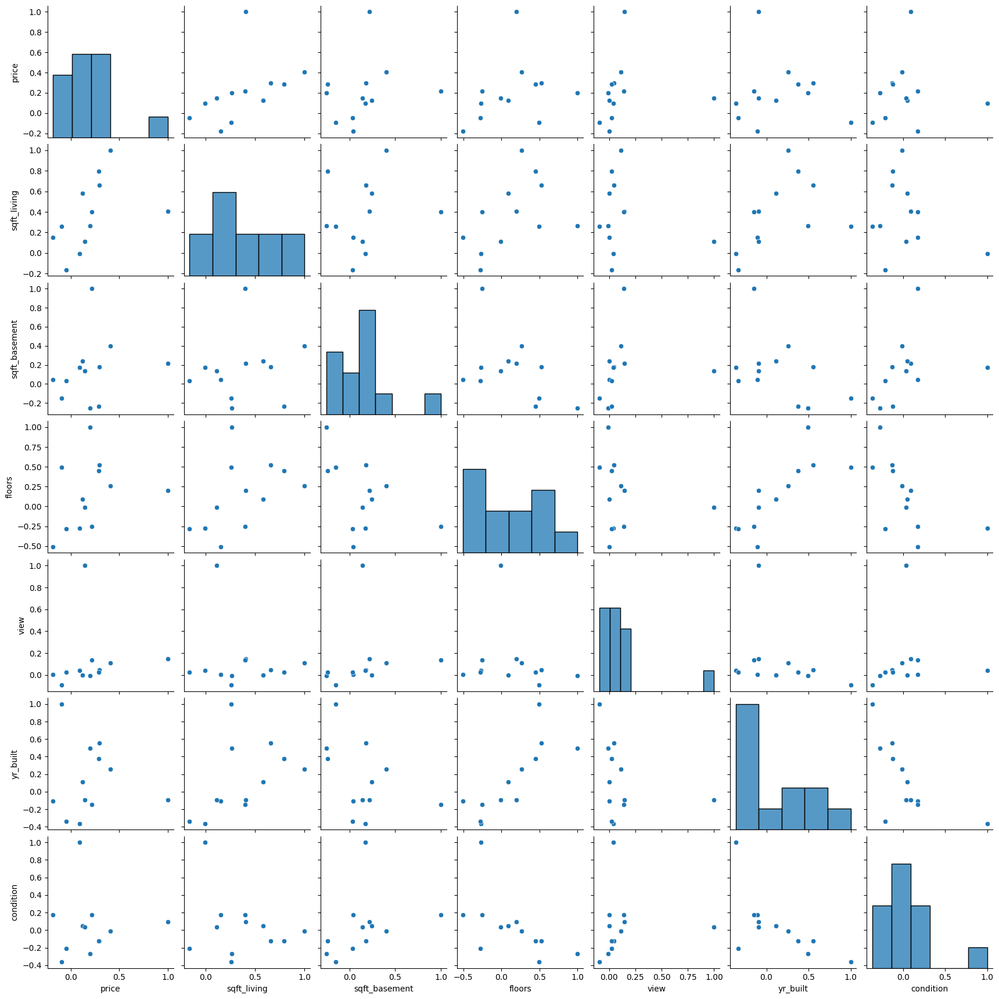

In [41]:
train = correlacion.loc[:,["price","sqft_living","sqft_basement","floors","view","yr_built","condition"]]
plt.figure(figsize=(20,10))
sns.pairplot(train)

In [42]:
datacl.to_csv("data_clean.csv")